# Imports

In [1]:
import os
import tarfile
from scipy.io import loadmat
from PIL import Image

# PyTorch
import torch
from torch import cuda
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# Torchvision
from torchvision import transforms, utils as torchvision_utils, models
from torchvision.models import vgg19, VGG19_Weights
from torchsummary import summary

# Data Splitting and Metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score

# Visualization
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# Extract the dataset
tgz_file = r"./102flowers.tgz"  # Replace with the path to your downloaded file
extract_path = "flowers102"

with tarfile.open(tgz_file, "r:gz") as tar:
    tar.extractall(path=extract_path)

print("Dataset extracted!")


Dataset extracted!


## Loading the labels

In [2]:

# Load the labels
annotations = loadmat(fr"./imagelabels.mat")
labels = annotations['labels'][0]
print(f"Total labels: {len(labels)}")


Total labels: 8189


## Rented a GPU on vast.ai to save time, using CUDA

In [3]:

# Check if CUDA is available
if torch.cuda.is_available():
    print("CUDA is available. GPUs are ready to use!")
else:
    print("CUDA is not available. Training will use the CPU.")


print(f"GPU {cuda.get_device_name(0)}")


CUDA is available. GPUs are ready to use!
GPU NVIDIA GeForce RTX 4090


# Dataset Preparation

In [4]:

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images
    transforms.ToTensor(),          # Convert to Tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

# Custom Dataset
class Flowers102Dataset(Dataset):
    def __init__(self, img_dir, labels, indices, transform=None):
        self.img_dir = img_dir
        self.labels = labels
        self.indices = indices
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, f"image_{self.indices[idx]:05d}.jpg")
        image = Image.open(img_path).convert("RGB")
        label = self.labels[self.indices[idx] - 1] - 1  # Convert to 0-based index
        if self.transform:
            image = self.transform(image)
        return image, label

# Split data
image_indices = list(range(1, len(labels) + 1))
train_idx, test_val_idx = train_test_split(image_indices, test_size=0.5, random_state=42)
val_idx, test_idx = train_test_split(test_val_idx, test_size=0.5, random_state=42)

# Create datasets
data_dir = f"{extract_path}/jpg"
train_dataset = Flowers102Dataset(data_dir, labels, train_idx, transform)
val_dataset = Flowers102Dataset(data_dir, labels, val_idx, transform)
test_dataset = Flowers102Dataset(data_dir, labels, test_idx, transform)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)


# Visualize a sample of the images

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid

# Function to display a grid of images with labels
def show_images_with_labels(inputs, classes, class_names, n_cols=4):
    """
    Displays a grid of images with their labels above each image.

    Args:
        inputs (torch.Tensor): Batch of images.
        classes (torch.Tensor): Corresponding labels for the images.
        class_names (list): List of class names.
        n_cols (int): Number of columns in the grid.
    """
    # Denormalize the images
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    
    # Number of images
    n_images = inputs.size(0)
    n_rows = (n_images + n_cols - 1) // n_cols  # Calculate required rows for the grid

    # Create a figure
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 150))
    axes = axes.flatten()  # Flatten for easier indexing

    for i in range(n_images):
        # Process the image for visualization
        img = inputs[i].numpy().transpose((1, 2, 0))  # Convert to HWC
        img = std * img + mean  # Denormalize
        img = np.clip(img, 0, 1)  # Clip values to valid range

        # Display the image
        axes[i].imshow(img)
        axes[i].set_title(class_names[classes[i].item()], fontsize=10)  # Set label above image
        axes[i].axis("off")  # Remove axes for a cleaner look

    # Turn off unused subplots if n_images is not a perfect multiple of n_cols
    for j in range(n_images, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

# Example Usage
# Get a batch of training data
inputs, classes = next(iter(test_loader))

# Define class names (replace with actual class names if available)
class_names = [f"Class {i}" for i in range(102)]  # Assuming 102 classes

# Show images with labels
show_images_with_labels(inputs, classes, class_names, n_cols=5)


In [59]:
# Early Stopping With Patience Mechanism
class EarlyStopping:
    def __init__(self, patience=5):
        self.patience = patience
        self.best_loss = float('inf')
        self.counter = 0
        self.best_model = None

    def step(self, loss, model):
        if loss < self.best_loss:
            self.best_loss = loss
            self.counter = 0
            self.best_model = model.state_dict()
            return True
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return False
            return True
        
# Training Loop + Validation Loop + Running Test at the end
def train_model(model, train_loader, val_loader, test_loader, num_epochs=10,device='cuda',optimizer=None, criterion=None,patience = None):
    best_accuracy = 0
    if patience is None:
        early_stopping = EarlyStopping(patience=5)
    else:
        early_stopping = EarlyStopping(patience=patience)

    # Track losses and accuracies
    train_losses, val_losses, test_losses = [], [], []
    train_accuracies, val_accuracies, test_accuracies = [], [], []

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print("-" * 20)

        # Training phase
        model.train()
        train_loss = 0.0
        train_preds, train_labels = [], []
        for inputs, labels in tqdm(train_loader, desc="Training"):
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            train_preds.extend(preds.cpu().numpy())
            train_labels.extend(labels.cpu().numpy())

        train_loss /= len(train_loader.dataset)
        train_losses.append(train_loss)
        train_accuracy = accuracy_score(train_labels, train_preds)
        train_accuracies.append(train_accuracy)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_preds, val_labels = [], []
        with torch.no_grad():
            for inputs, labels in tqdm(val_loader, desc="Validation"):
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_preds.extend(preds.cpu().numpy())
                val_labels.extend(labels.cpu().numpy())

        val_loss /= len(val_loader.dataset)
        val_losses.append(val_loss)
        val_accuracy = accuracy_score(val_labels, val_preds)
        val_accuracies.append(val_accuracy)

        print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

        # Save best model
        if val_accuracy > best_accuracy:
            best_accuracy = val_accuracy
            torch.save(model.state_dict(), "best_model.pth")

        # Early stopping
        if not early_stopping.step(val_loss, model):
            print("Early stopping triggered")
            break

    # Test phase
    model.load_state_dict(torch.load("best_model.pth"))
    model.eval()
    test_loss = 0.0
    test_preds, test_labels = [], []
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc="Testing"):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            test_preds.extend(preds.cpu().numpy())
            test_labels.extend(labels.cpu().numpy())

    test_loss /= len(test_loader.dataset)
    test_accuracy = accuracy_score(test_labels, test_preds)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)

    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    # Return all metrics
    return train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies




In [14]:

def plot_training_metrics(epochs, train_losses, val_losses, test_losses=None, 
                          train_accuracies=None, val_accuracies=None, test_accuracies=None):
    """
    Plots training metrics including loss and accuracy for training, validation, and test phases.
    
    Args:
        epochs (list or range): The range of epochs.
        train_losses (list): List of training loss values.
        val_losses (list): List of validation loss values.
        test_losses (list, optional): List of test loss values.
        train_accuracies (list, optional): List of training accuracy values.
        val_accuracies (list, optional): List of validation accuracy values.
        test_accuracies (list, optional): List of test accuracy values.
    """
    # Plot Losses
    plt.figure()
    plt.plot(epochs, train_losses, label="Training Loss")
    plt.plot(epochs, val_losses, label="Validation Loss")
    if test_losses:
        plt.plot(epochs, test_losses, label="Test Loss", linestyle='--')
    plt.title("Loss over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    # Plot Accuracies if provided
    if train_accuracies and val_accuracies:
        plt.figure()
        plt.plot(epochs, train_accuracies, label="Training Accuracy")
        plt.plot(epochs, val_accuracies, label="Validation Accuracy")
        if test_accuracies:
            plt.plot(epochs, test_accuracies, label="Test Accuracy", linestyle='--')
        plt.title("Accuracy over Epochs")
        plt.xlabel("Epochs")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.show()





In [7]:

model = torch.hub.load('ultralytics/yolov5', 'custom', path='./weights/yolov5s-cls.pt')

# Inspect the model architecture to locate the classification layer
print(model.model)

# Update the final classification layer
num_classes = 102  # Replace with your number of classes
if hasattr(model.model.model[-1], 'linear'):  # Check if the last layer has a 'linear' attribute
    model.model.model[-1].linear = torch.nn.Linear(
        model.model.model[-1].linear.in_features, num_classes
    )
else:
    raise ValueError("Could not find the final classification layer. Inspect the model architecture.")

# Move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
# Provide input size (e.g., 3x224x224 for an RGB image)
summary(model, input_size=(3, 224, 224))
# Define optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.005)
criterion = nn.CrossEntropyLoss()


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-1-24 Python-3.10.13 torch-2.2.0 CUDA:0 (NVIDIA GeForce RTX 4090, 24073MiB)

Fusing layers... 
Model summary: 117 layers, 5447688 parameters, 0 gradients, 11.4 GFLOPs
WARNING ⚠️ YOLOv5 ClassificationModel is not yet AutoShape compatible. You must pass torch tensors in BCHW to this model, i.e. shape(1,3,224,224).


ClassificationModel(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (act): SiLU(inplace=True)
    )
    (2): C3(
      (cv1): Conv(
        (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
        (act): SiLU(inplace=True)
      )
      (cv2): Conv(
        (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
        (act): SiLU(inplace=True)
      )
      (cv3): Conv(
        (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
        (act): SiLU(inplace=True)
      )
      (m): Sequential(
        (0): Bottleneck(
          (cv1): Conv(
            (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1

In [15]:
summary(model, input_size=(3, 224, 224))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]           3,488
              SiLU-2         [-1, 32, 112, 112]               0
              Conv-3         [-1, 32, 112, 112]               0
            Conv2d-4           [-1, 64, 56, 56]          18,496
              SiLU-5           [-1, 64, 56, 56]               0
              Conv-6           [-1, 64, 56, 56]               0
            Conv2d-7           [-1, 32, 56, 56]           2,080
              SiLU-8           [-1, 32, 56, 56]               0
              Conv-9           [-1, 32, 56, 56]               0
           Conv2d-10           [-1, 32, 56, 56]           1,056
             SiLU-11           [-1, 32, 56, 56]               0
             Conv-12           [-1, 32, 56, 56]               0
           Conv2d-13           [-1, 32, 56, 56]           9,248
             SiLU-14           [-1, 32,

# Finetuning YOLOv5

In [8]:
# Run training
train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies = train_model(
    model, train_loader, val_loader, test_loader, num_epochs=20, device=device, optimizer=optimizer, criterion=criterion
)



Epoch 1/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.71it/s]

Train Loss: 1.7558, Train Accuracy: 0.6463
Val Loss: 0.6698, Val Accuracy: 0.8300
Epoch 2/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]

Train Loss: 0.2832, Train Accuracy: 0.9443
Val Loss: 0.4230, Val Accuracy: 0.8999
Epoch 3/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]

Train Loss: 0.1268, Train Accuracy: 0.9866
Val Loss: 0.3706, Val Accuracy: 0.9096
Epoch 4/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]

Train Loss: 0.0782, Train Accuracy: 0.9946
Val Loss: 0.3404, Val Accuracy: 0.9160
Epoch 5/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]

Train Loss: 0.0521, Train Accuracy: 0.9993
Val Loss: 0.3241, Val Accuracy: 0.9223
Epoch 6/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.67it/s]

Train Loss: 0.0382, Train Accuracy: 0.9993
Val Loss: 0.3255, Val Accuracy: 0.9170
Epoch 7/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.67it/s]

Train Loss: 0.0304, Train Accuracy: 0.9998
Val Loss: 0.3093, Val Accuracy: 0.9228
Epoch 8/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]

Train Loss: 0.0238, Train Accuracy: 1.0000
Val Loss: 0.3004, Val Accuracy: 0.9253
Epoch 9/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]

Train Loss: 0.0197, Train Accuracy: 1.0000
Val Loss: 0.2949, Val Accuracy: 0.9282
Epoch 10/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.67it/s]

Train Loss: 0.0166, Train Accuracy: 1.0000
Val Loss: 0.2937, Val Accuracy: 0.9257
Epoch 11/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]

Train Loss: 0.0145, Train Accuracy: 1.0000
Val Loss: 0.2912, Val Accuracy: 0.9277
Epoch 12/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]

Train Loss: 0.0127, Train Accuracy: 1.0000
Val Loss: 0.2874, Val Accuracy: 0.9287
Epoch 13/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]

Train Loss: 0.0111, Train Accuracy: 1.0000
Val Loss: 0.2853, Val Accuracy: 0.9282
Epoch 14/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]

Train Loss: 0.0099, Train Accuracy: 1.0000
Val Loss: 0.2831, Val Accuracy: 0.9297
Epoch 15/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.51it/s]

Train Loss: 0.0090, Train Accuracy: 1.0000
Val Loss: 0.2831, Val Accuracy: 0.9282
Epoch 16/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]

Train Loss: 0.0081, Train Accuracy: 1.0000
Val Loss: 0.2805, Val Accuracy: 0.9292
Epoch 17/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]

Train Loss: 0.0074, Train Accuracy: 1.0000
Val Loss: 0.2822, Val Accuracy: 0.9277
Epoch 18/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]

Train Loss: 0.0068, Train Accuracy: 1.0000
Val Loss: 0.2807, Val Accuracy: 0.9292
Epoch 19/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

Train Loss: 0.0063, Train Accuracy: 1.0000
Val Loss: 0.2771, Val Accuracy: 0.9311
Epoch 20/20
--------------------




alidation: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]

Train Loss: 0.0058, Train Accuracy: 1.0000
Val Loss: 0.2774, Val Accuracy: 0.9306


Testing: 100%|██████████| 16/16 [00:04<00:00,  3.63it/s]

Test Loss: 0.2463, Test Accuracy: 0.9312


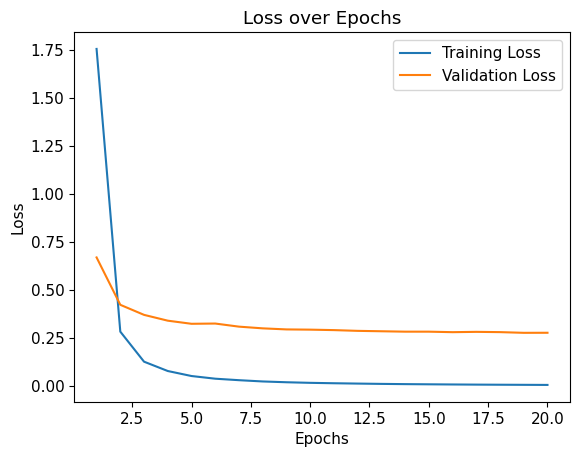

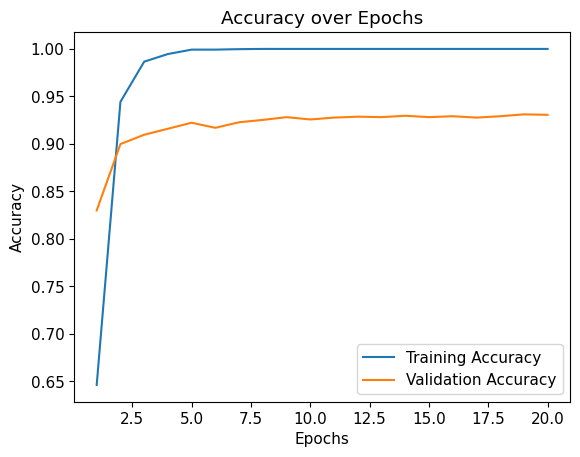

In [9]:
%matplotlib inline
# Generate the range of epochs
epochs = range(1, len(train_losses) + 1)

# Call the plotting function
plot_training_metrics(
    epochs=epochs,
    train_losses=train_losses,
    val_losses=val_losses,
    train_accuracies=train_accuracies,
    val_accuracies=val_accuracies,
)

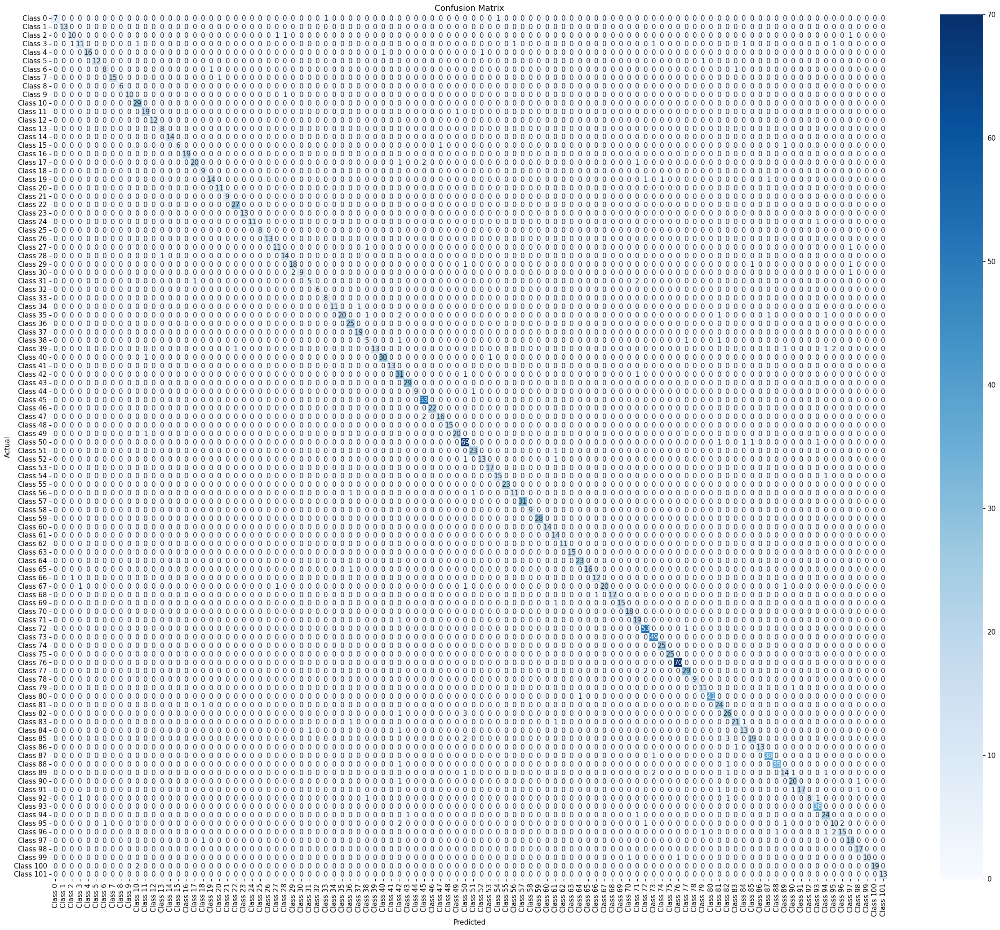

              precision    recall  f1-score   support

     Class 0       1.00      0.78      0.88         9
     Class 1       1.00      1.00      1.00        13
     Class 2       0.83      0.77      0.80        13
     Class 3       0.85      0.65      0.73        17
     Class 4       1.00      0.89      0.94        18
     Class 5       1.00      0.92      0.96        13
     Class 6       0.89      0.80      0.84        10
     Class 7       1.00      0.94      0.97        16
     Class 8       1.00      1.00      1.00         6
     Class 9       1.00      0.91      0.95        11
    Class 10       0.91      1.00      0.95        29
    Class 11       0.90      0.95      0.93        20
    Class 12       1.00      1.00      1.00        12
    Class 13       0.89      1.00      0.94         8
    Class 14       1.00      1.00      1.00        14
    Class 15       1.00      0.75      0.86         8
    Class 16       1.00      1.00      1.00        19
    Class 17       0.95    

In [17]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Get predictions and ground truth from the test set
model.eval()  # Set model to evaluation mode
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)  # Get class predictions
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Generate confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)

# Plot confusion matrix
plt.figure(figsize=(30, 25))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Generate classification report
print(classification_report(all_labels, all_preds, target_names=class_names))


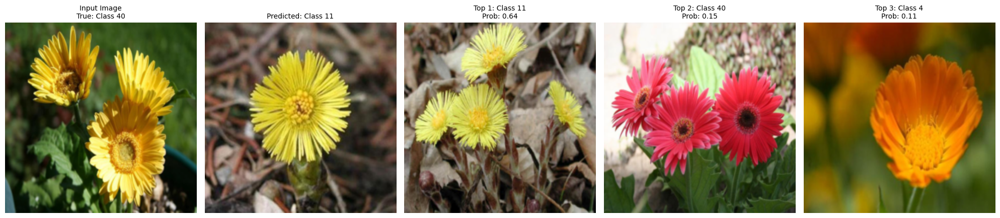

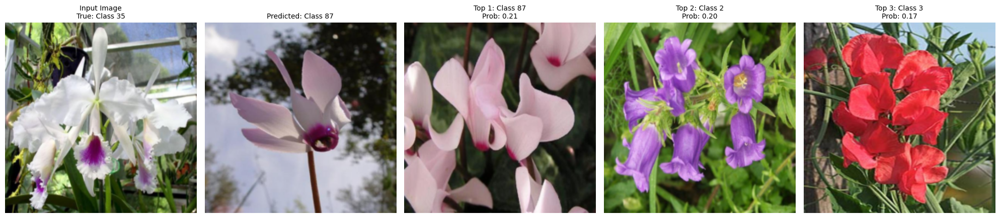

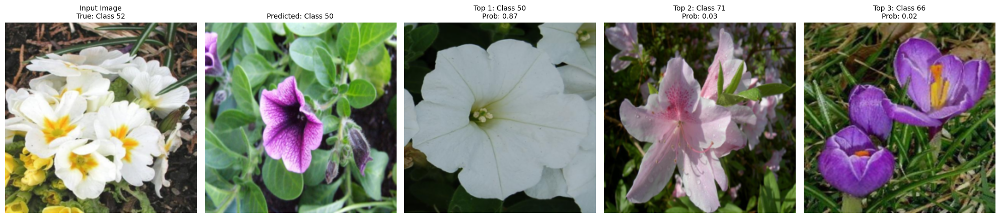

In [22]:
def visualize_misclassifications(sample_indices, test_dataset, all_preds, all_labels, class_names, model, class_to_image_indices):
    """
    Visualizes misclassified samples in rows of 5 images:
    1. Input image with its true label.
    2. Predicted class with an example image from that class.
    3-5. Top 3 predictions with corresponding probabilities and example images.

    Args:
        sample_indices (list): Indices of the misclassified samples.
        test_dataset (Dataset): The test dataset.
        all_preds (list): List of predictions.
        all_labels (list): List of ground truth labels.
        class_names (list): List of class names.
        model (torch.nn.Module): The trained model.
        class_to_image_indices (dict): A dictionary mapping class indices to dataset indices.
    """
    model.eval()
    for idx in sample_indices:
        # Get the input image and label
        image, true_label = test_dataset[idx]
        assert true_label == all_labels[idx], f"Mismatch: Dataset label {true_label}, All labels {all_labels[idx]}"
        image = image.unsqueeze(0).to(device)  # Add batch dimension and move to device

        # Get model predictions and probabilities
        with torch.no_grad():
            outputs = model(image)
            probabilities = torch.softmax(outputs, dim=1).squeeze().cpu().numpy()

        # Get the top 3 predicted probabilities and their indices
        top3_indices = np.argsort(probabilities)[-3:][::-1]
        top3_labels = [class_names[i] for i in top3_indices]
        top3_probs = probabilities[top3_indices]

        # Prepare the input image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = image.cpu().squeeze().numpy().transpose((1, 2, 0))
        img = std * img + mean
        img = np.clip(img, 0, 1)

        # Create the figure
        fig, axes = plt.subplots(1, 5, figsize=(20, 5))
        
        # Plot the input image with the true label
        axes[0].imshow(img)
        axes[0].set_title(f"Input Image\nTrue: {class_names[true_label]}", fontsize=10)
        axes[0].axis("off")

        # Plot the predicted class with an example image
        pred_class = all_preds[idx]
        pred_example_idx = np.random.choice(class_to_image_indices[pred_class])  # Randomly select an example
        pred_image, _ = test_dataset[pred_example_idx]
        pred_image = pred_image.numpy().transpose((1, 2, 0))
        pred_image = std * pred_image + mean
        pred_image = np.clip(pred_image, 0, 1)
        axes[1].imshow(pred_image)
        axes[1].set_title(f"Predicted: {class_names[pred_class]}", fontsize=10)
        axes[1].axis("off")

        # Plot images for the top 3 predictions
        for i, top_idx in enumerate(top3_indices):
            top_example_idx = np.random.choice(class_to_image_indices[top_idx])  # Randomly select an example
            top_image, _ = test_dataset[top_example_idx]
            top_image = top_image.numpy().transpose((1, 2, 0))
            top_image = std * top_image + mean
            top_image = np.clip(top_image, 0, 1)
            axes[i + 2].imshow(top_image)
            axes[i + 2].set_title(
                f"Top {i+1}: {class_names[top_idx]}\nProb: {top3_probs[i]:.2f}",
                fontsize=10,
            )
            axes[i + 2].axis("off")

        plt.tight_layout()
        plt.show()


from collections import defaultdict

class_to_image_indices = defaultdict(list)
for idx in range(len(test_dataset)):
    _, label = test_dataset[idx]
    class_to_image_indices[label].append(idx)


# Assume `test_dataset`, `all_preds`, `all_labels`, and `model` are already defined
all_preds = np.array(all_preds)  # Model predictions
all_labels = np.array(all_labels)  # True labels from the dataset

# Find misclassified samples
misclassified_indices = np.where(all_preds != all_labels)[0]

# Randomly sample 3 misclassifications
sample_indices = np.random.choice(misclassified_indices, size=3, replace=False)

visualize_misclassifications(
    sample_indices=sample_indices,
    test_dataset=test_dataset,
    all_preds=all_preds,
    all_labels=all_labels,
    class_names=class_names,
    model=model,
    class_to_image_indices=class_to_image_indices
)



# Using a pretrained VGG19 for fine-tuning

In [23]:
import torch
import torch.nn as nn
from torchvision import models
from tqdm import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
import matplotlib.pyplot as plt
from torchvision.models import vgg19, VGG19_Weights

# Load pretrained VGG19
model = vgg19(weights=VGG19_Weights.DEFAULT)

# Modify the classifier to match the number of classes
num_classes = 102  # Total flower categories
model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)

# Freeze all layers except the last fully connected layer
for param in model.parameters():
    param.requires_grad = False  # Freeze all parameters

# Unfreeze the last layer (classifier[6])
for param in model.classifier[6].parameters():
    param.requires_grad = True  # Unfreeze only the last layer

# Transfer model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Print summary of trainable parameters
print("Trainable layers:")
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name)

# Define optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.005)
criterion = nn.CrossEntropyLoss()

Trainable layers:
classifier.6.weight
classifier.6.bias


In [24]:
summary(model, input_size=(3, 224, 224))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

Epoch 1/20
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

Train Loss: 2.3203, Train Accuracy: 0.4761
Val Loss: 1.2246, Val Accuracy: 0.6649
Epoch 2/20
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 0.9505, Train Accuracy: 0.7374
Val Loss: 0.9665, Val Accuracy: 0.7465
Epoch 3/20
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 0.7233, Train Accuracy: 0.7897
Val Loss: 0.9799, Val Accuracy: 0.7533
Epoch 4/20
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

Train Loss: 0.6155, Train Accuracy: 0.8188
Val Loss: 1.0141, Val Accuracy: 0.7357
Epoch 5/20
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

Train Loss: 0.5764, Train Accuracy: 0.8317
Val Loss: 1.0540, Val Accuracy: 0.7460
Epoch 6/20
--------------------




alidation: 100%|██████████| 16/16 [00:05<00:00,  2.71it/s]

Train Loss: 0.5440, Train Accuracy: 0.8425
Val Loss: 0.9452, Val Accuracy: 0.7606
Epoch 7/20
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

Train Loss: 0.4827, Train Accuracy: 0.8476
Val Loss: 0.9358, Val Accuracy: 0.7704
Epoch 8/20
--------------------




alidation: 100%|██████████| 16/16 [00:05<00:00,  2.68it/s]

Train Loss: 0.4660, Train Accuracy: 0.8613
Val Loss: 0.9838, Val Accuracy: 0.7684
Epoch 9/20
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 0.4713, Train Accuracy: 0.8603
Val Loss: 1.0073, Val Accuracy: 0.7738
Epoch 10/20
--------------------




alidation: 100%|██████████| 16/16 [00:05<00:00,  2.68it/s]

Train Loss: 0.4539, Train Accuracy: 0.8627
Val Loss: 0.9987, Val Accuracy: 0.7733
Epoch 11/20
--------------------




alidation: 100%|██████████| 16/16 [00:05<00:00,  2.69it/s]

Train Loss: 0.4058, Train Accuracy: 0.8791
Val Loss: 1.0474, Val Accuracy: 0.7728
Epoch 12/20
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 0.4364, Train Accuracy: 0.8718
Val Loss: 0.9758, Val Accuracy: 0.7890
Early stopping triggered


Testing: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Test Loss: 0.9371, Test Accuracy: 0.7939


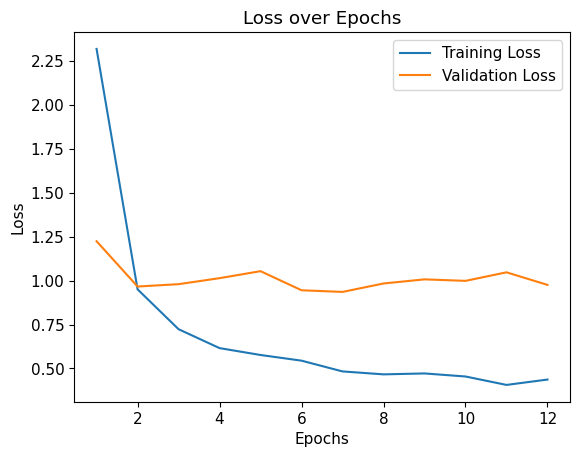

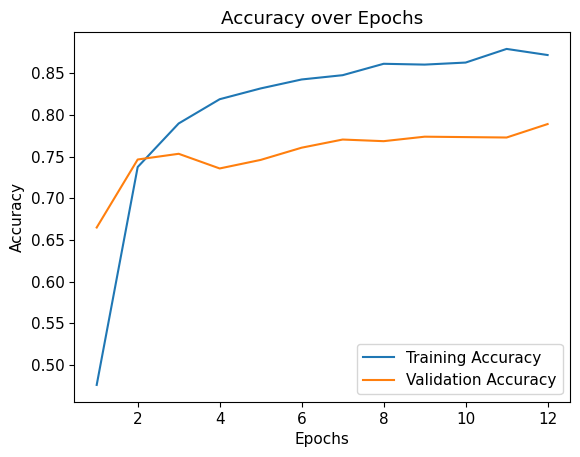

In [25]:
# Run training
train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies = train_model(
    model, train_loader, val_loader, test_loader, num_epochs=20,device=device, optimizer=optimizer, criterion=criterion
)
# Generate the range of epochs
epochs = range(1, len(train_losses) + 1)

# Call the plotting function
plot_training_metrics(
    epochs=epochs,
    train_losses=train_losses,
    val_losses=val_losses,
    train_accuracies=train_accuracies,
    val_accuracies=val_accuracies,
)


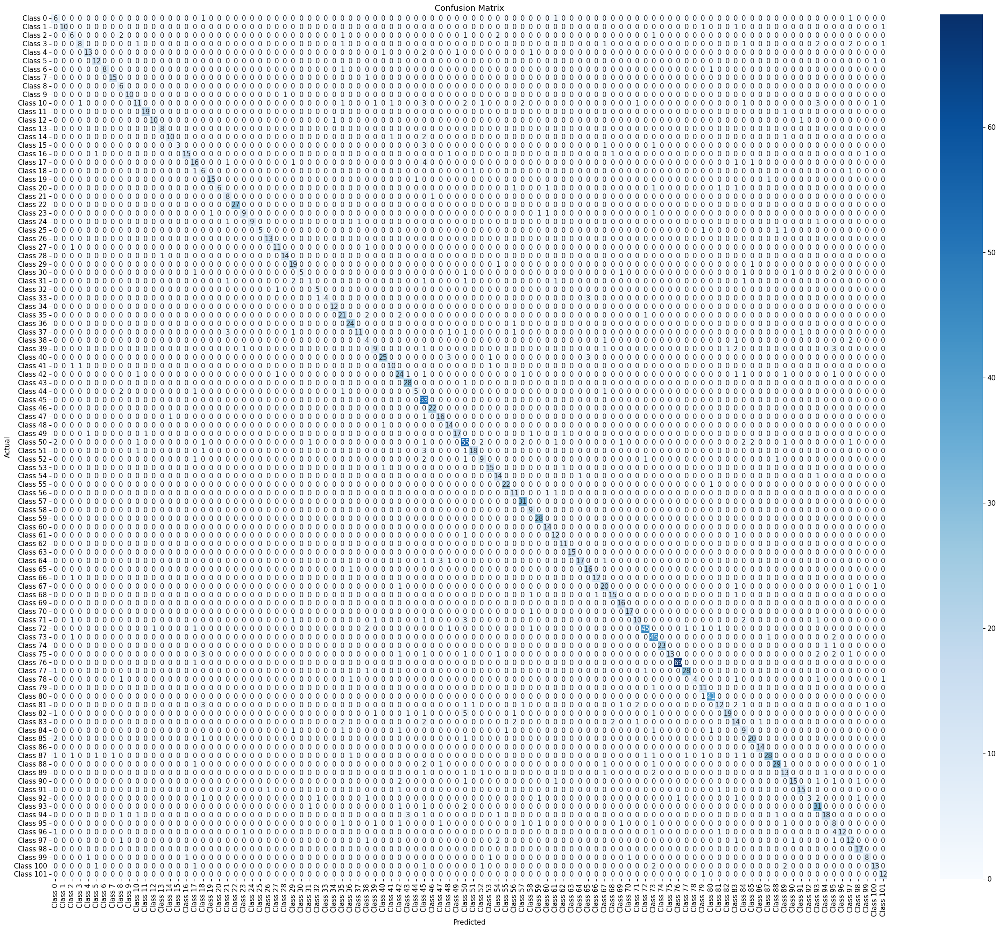

              precision    recall  f1-score   support

     Class 0       0.43      0.67      0.52         9
     Class 1       1.00      0.77      0.87        13
     Class 2       0.50      0.46      0.48        13
     Class 3       0.80      0.47      0.59        17
     Class 4       0.87      0.72      0.79        18
     Class 5       0.80      0.92      0.86        13
     Class 6       1.00      0.80      0.89        10
     Class 7       0.94      0.94      0.94        16
     Class 8       0.46      1.00      0.63         6
     Class 9       1.00      0.91      0.95        11
    Class 10       0.69      0.38      0.49        29
    Class 11       0.95      0.95      0.95        20
    Class 12       0.91      0.83      0.87        12
    Class 13       0.89      1.00      0.94         8
    Class 14       0.91      0.71      0.80        14
    Class 15       1.00      0.38      0.55         8
    Class 16       0.94      0.79      0.86        19
    Class 17       0.67    

In [26]:
# Get predictions and ground truth from the test set
model.eval()  # Set model to evaluation mode
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)  # Get class predictions
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Generate confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)

# Plot confusion matrix
plt.figure(figsize=(30, 25))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Generate classification report
print(classification_report(all_labels, all_preds, target_names=class_names))

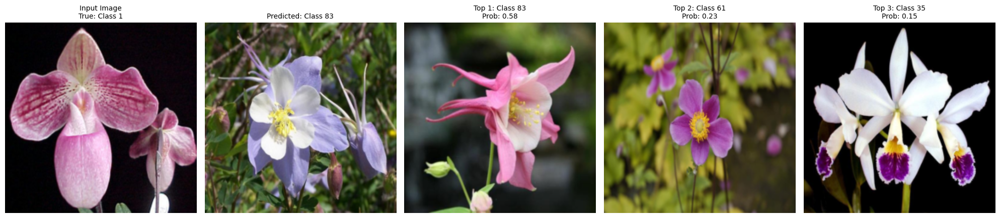

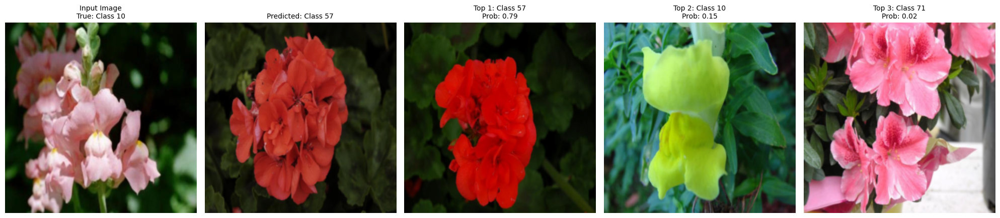

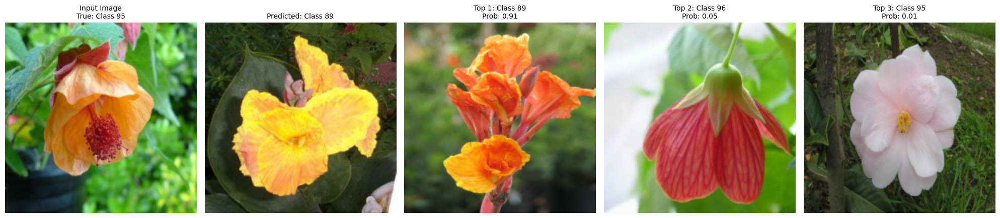

In [27]:
# Assume `test_dataset`, `all_preds`, `all_labels`, and `model` are already defined
all_preds = np.array(all_preds)  # Model predictions
all_labels = np.array(all_labels)  # True labels from the dataset

# Find misclassified samples
misclassified_indices = np.where(all_preds != all_labels)[0]

# Randomly sample 3 misclassifications
sample_indices = np.random.choice(misclassified_indices, size=3, replace=False)

visualize_misclassifications(
    sample_indices=sample_indices,
    test_dataset=test_dataset,
    all_preds=all_preds,
    all_labels=all_labels,
    class_names=class_names,
    model=model,
    class_to_image_indices=class_to_image_indices
)

In [42]:
# Improving Results of VGG with Data Augmentation

In [60]:
# Load pretrained VGG19
model = vgg19(weights=VGG19_Weights.DEFAULT)

# Modify the classifier to match the number of classes
num_classes = 102  # Total flower categories
model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)

# Freeze all layers except the last fully connected layer
for param in model.parameters():
    param.requires_grad = False  # Freeze all parameters

# Unfreeze the last layer (classifier[6])
for param in model.classifier[6].parameters():
    param.requires_grad = True  # Unfreeze only the last layer

# Transfer model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Print summary of trainable parameters
print("Trainable layers:")
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name)

# Define optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.005)
criterion = nn.CrossEntropyLoss()

Trainable layers:
classifier.6.weight
classifier.6.bias


In [61]:

# Load the labels
annotations = loadmat(fr"./imagelabels.mat")
labels = annotations['labels'][0]
print(f"Total labels: {len(labels)}")


Total labels: 8189


In [62]:
from torchvision.transforms import RandomErasing

# Define transformations with Random Erasing
train_transform = transforms.Compose([
    transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0.1),
    transforms.Resize((224, 224)),           # Resize images
    transforms.ToTensor(),                   # Convert to Tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalize
    RandomErasing(p=0.4, scale=(0.02, 0.2), ratio=(0.15, 1.5), value='random'),  # Add Random Erasing
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),           # Resize images
    transforms.ToTensor(),                   # Convert to Tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

# Create datasets with updated transformations
train_dataset = Flowers102Dataset(data_dir, labels, train_idx, transform=train_transform)
val_dataset = Flowers102Dataset(data_dir, labels, val_idx, transform=val_test_transform)
test_dataset = Flowers102Dataset(data_dir, labels, test_idx, transform=val_test_transform)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)


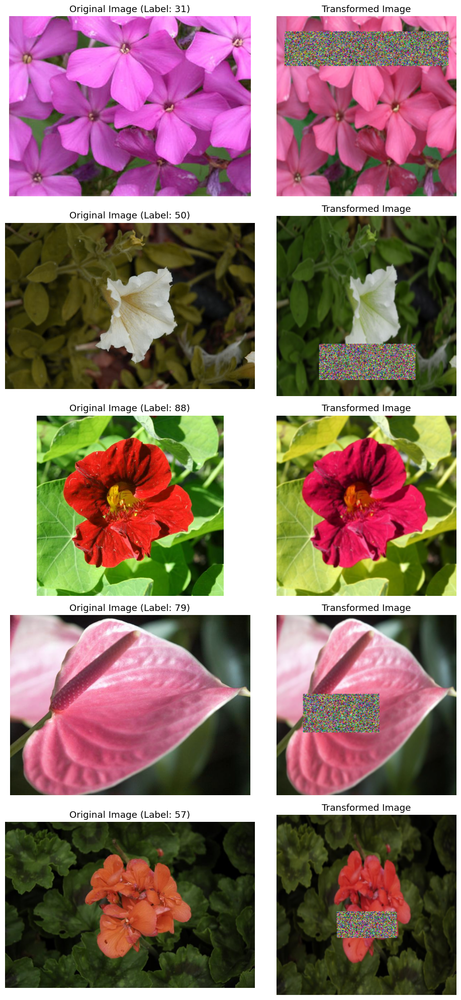

In [63]:
def visualize_transformations(dataset, num_samples=5):
    """
    Visualizes X samples from the dataset, showing the transformed image side by side with the original image.

    Args:
        dataset (Dataset): The dataset to sample from.
        num_samples (int): Number of samples to visualize.
    """
    import matplotlib.pyplot as plt

    # Denormalization parameters
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Create a figure for visualizing samples
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 4 * num_samples))
    
    for i in range(num_samples):
        # Randomly pick a sample
        idx = np.random.randint(0, len(dataset))
        img, label = dataset[idx]  # img is already transformed by the dataset

        # Denormalize the original (transformed) image
        img = img.numpy().transpose((1, 2, 0))  # Convert Tensor to HWC for display
        img = std * img + mean  # Denormalize
        img = np.clip(img, 0, 1)

        # Fetch the untransformed (original) image directly from the dataset source
        # Assume dataset uses an internal `transform` attribute
        original_img = dataset.transform.transforms[0](Image.open(f"{dataset.img_dir}/image_{dataset.indices[idx]:05d}.jpg").convert("RGB"))

        # Plot the original and transformed images
        axes[i, 0].imshow(original_img)
        axes[i, 0].set_title(f"Original Image (Label: {label})")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(img)
        axes[i, 1].set_title("Transformed Image")
        axes[i, 1].axis("off")
    
    plt.tight_layout()
    plt.show()

visualize_transformations(train_dataset, num_samples=5)


In [53]:
import os
num_images = len([f for f in os.listdir(data_dir) if f.endswith('.jpg')])
print(f"Number of images: {num_images}")
print(f"Number of labels: {len(labels)}")


Number of images: 8189
Number of labels: 8189


Epoch 1/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 3.1171, Train Accuracy: 0.3615
Val Loss: 1.3835, Val Accuracy: 0.6434
Epoch 2/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

Train Loss: 1.6224, Train Accuracy: 0.6001
Val Loss: 1.2185, Val Accuracy: 0.6776
Epoch 3/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 1.4603, Train Accuracy: 0.6456
Val Loss: 1.1489, Val Accuracy: 0.7025
Epoch 4/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 1.5015, Train Accuracy: 0.6426
Val Loss: 1.0723, Val Accuracy: 0.7128
Epoch 5/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 1.4118, Train Accuracy: 0.6705
Val Loss: 1.0847, Val Accuracy: 0.7191
Epoch 6/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 1.4219, Train Accuracy: 0.6715
Val Loss: 1.1205, Val Accuracy: 0.7215
Epoch 7/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 1.3760, Train Accuracy: 0.6820
Val Loss: 1.0564, Val Accuracy: 0.7509
Epoch 8/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 1.3754, Train Accuracy: 0.6810
Val Loss: 1.0730, Val Accuracy: 0.7450
Epoch 9/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 1.3622, Train Accuracy: 0.7032
Val Loss: 1.0864, Val Accuracy: 0.7430
Epoch 10/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 1.3160, Train Accuracy: 0.6988
Val Loss: 1.0580, Val Accuracy: 0.7430
Epoch 11/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s]

Train Loss: 1.2726, Train Accuracy: 0.7247
Val Loss: 1.0838, Val Accuracy: 0.7499
Epoch 12/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 1.3240, Train Accuracy: 0.7103
Val Loss: 1.0289, Val Accuracy: 0.7577
Epoch 13/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s]

Train Loss: 1.3594, Train Accuracy: 0.7110
Val Loss: 1.1280, Val Accuracy: 0.7430
Epoch 14/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 1.3288, Train Accuracy: 0.7286
Val Loss: 1.1424, Val Accuracy: 0.7435
Epoch 15/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 1.3254, Train Accuracy: 0.7176
Val Loss: 1.0416, Val Accuracy: 0.7592
Epoch 16/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 1.3582, Train Accuracy: 0.7267
Val Loss: 1.1348, Val Accuracy: 0.7465
Epoch 17/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 1.3580, Train Accuracy: 0.7286
Val Loss: 1.0915, Val Accuracy: 0.7694
Epoch 18/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 1.4063, Train Accuracy: 0.7171
Val Loss: 1.2481, Val Accuracy: 0.7479
Epoch 19/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 1.3809, Train Accuracy: 0.7338
Val Loss: 1.1332, Val Accuracy: 0.7616
Epoch 20/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 1.4025, Train Accuracy: 0.7374
Val Loss: 1.1519, Val Accuracy: 0.7655
Epoch 21/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 1.4378, Train Accuracy: 0.7291
Val Loss: 1.1926, Val Accuracy: 0.7567
Epoch 22/50
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 1.3370, Train Accuracy: 0.7418
Val Loss: 1.2886, Val Accuracy: 0.7528
Early stopping triggered


Testing: 100%|██████████| 16/16 [00:05<00:00,  2.67it/s]

Test Loss: 1.0964, Test Accuracy: 0.7666


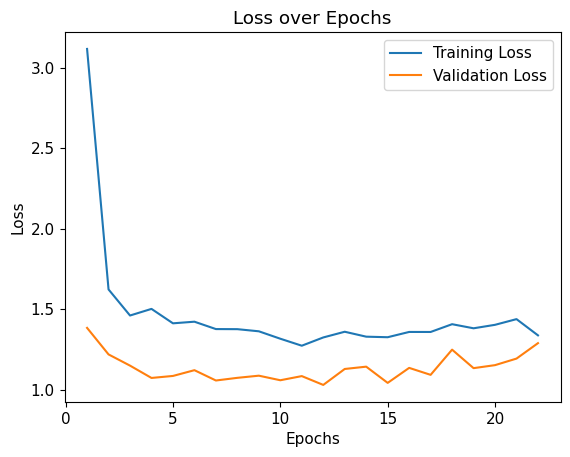

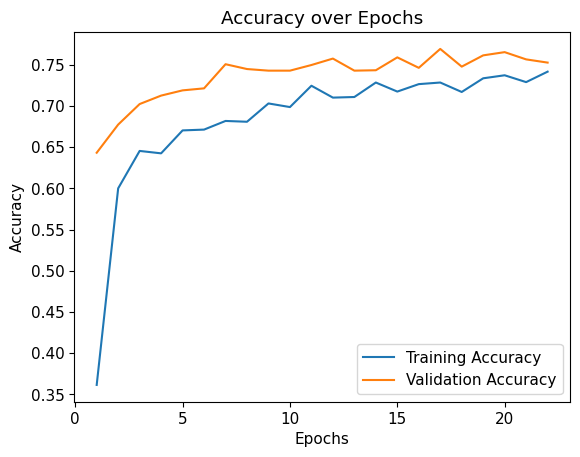

In [64]:
# Run training
train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies = train_model(
    model, train_loader, val_loader, test_loader, num_epochs=50,device=device, optimizer=optimizer, criterion=criterion,
    patience=10
)
# Generate the range of epochs
epochs = range(1, len(train_losses) + 1)

# Call the plotting function
plot_training_metrics(
    epochs=epochs,
    train_losses=train_losses,
    val_losses=val_losses,
    train_accuracies=train_accuracies,
    val_accuracies=val_accuracies,
)


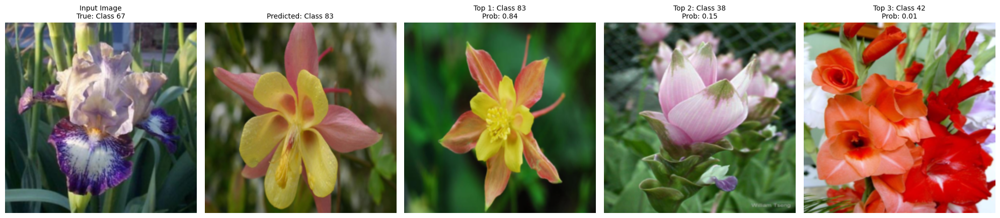

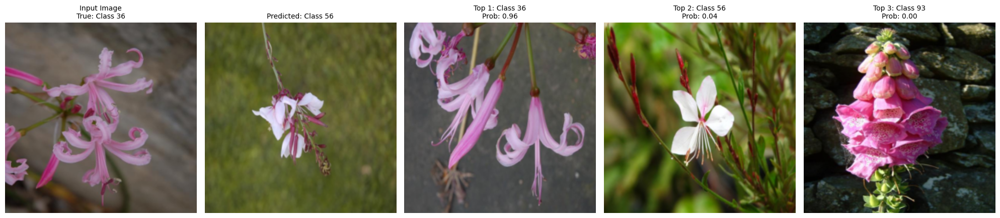

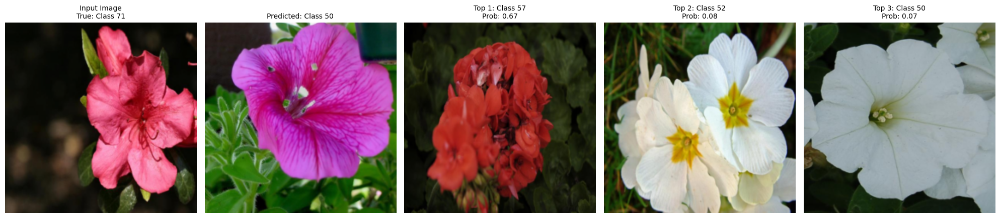

In [65]:
# Assume `test_dataset`, `all_preds`, `all_labels`, and `model` are already defined
all_preds = np.array(all_preds)  # Model predictions
all_labels = np.array(all_labels)  # True labels from the dataset

# Find misclassified samples
misclassified_indices = np.where(all_preds != all_labels)[0]

# Randomly sample 3 misclassifications
sample_indices = np.random.choice(misclassified_indices, size=3, replace=False)

visualize_misclassifications(
    sample_indices=sample_indices,
    test_dataset=test_dataset,
    all_preds=all_preds,
    all_labels=all_labels,
    class_names=class_names,
    model=model,
    class_to_image_indices=class_to_image_indices
)

In [73]:
# Improving Results with Fuller Fine tuning

In [66]:
# Unfreeze some early layers in the feature extractor
# For example, unfreeze the last two convolutional blocks
for name, param in model.features.named_parameters():
    if "34" in name or "32" in name:  # Adjust indices based on VGG19 architecture
        param.requires_grad = True  # Unfreeze these layers

# Confirm which layers are now trainable
print("Updated Trainable Layers:")
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name)


Updated Trainable Layers:
features.32.weight
features.32.bias
features.34.weight
features.34.bias
classifier.6.weight
classifier.6.bias


In [67]:

# Load the labels
annotations = loadmat(fr"./imagelabels.mat")
labels = annotations['labels'][0]
print(f"Total labels: {len(labels)}")

Total labels: 8189


In [68]:
import os
num_images = len([f for f in os.listdir(data_dir) if f.endswith('.jpg')])
print(f"Number of images: {num_images}")
print(f"Number of labels: {len(labels)}")


Number of images: 8189
Number of labels: 8189


In [69]:
summary(model,(3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

Epoch 1/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 36.3824, Train Accuracy: 0.0393
Val Loss: 4.5303, Val Accuracy: 0.0176
Epoch 2/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 4.4441, Train Accuracy: 0.0454
Val Loss: 3.9866, Val Accuracy: 0.1114
Epoch 3/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s]

Train Loss: 3.9814, Train Accuracy: 0.1050
Val Loss: 3.6796, Val Accuracy: 0.1402
Epoch 4/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 3.6146, Train Accuracy: 0.1463
Val Loss: 3.2204, Val Accuracy: 0.2027
Epoch 5/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 3.2843, Train Accuracy: 0.1964
Val Loss: 2.9541, Val Accuracy: 0.2843
Epoch 6/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 2.9627, Train Accuracy: 0.2611
Val Loss: 2.6182, Val Accuracy: 0.3508
Epoch 7/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s]

Train Loss: 2.6892, Train Accuracy: 0.3134
Val Loss: 2.3710, Val Accuracy: 0.3962
Epoch 8/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s]

Train Loss: 2.4446, Train Accuracy: 0.3725
Val Loss: 2.1076, Val Accuracy: 0.4382
Epoch 9/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 2.1308, Train Accuracy: 0.4372
Val Loss: 1.9579, Val Accuracy: 0.4963
Epoch 10/60
--------------------




alidation: 100%|██████████| 16/16 [00:05<00:00,  2.67it/s]

Train Loss: 1.9441, Train Accuracy: 0.4744
Val Loss: 1.8804, Val Accuracy: 0.4954
Epoch 11/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 1.7623, Train Accuracy: 0.5137
Val Loss: 1.6635, Val Accuracy: 0.5603
Epoch 12/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 1.6243, Train Accuracy: 0.5471
Val Loss: 1.6145, Val Accuracy: 0.5638
Epoch 13/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 1.5228, Train Accuracy: 0.5791
Val Loss: 1.4128, Val Accuracy: 0.6380
Epoch 14/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 1.4542, Train Accuracy: 0.5911
Val Loss: 1.3978, Val Accuracy: 0.6253
Epoch 15/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

Train Loss: 1.4711, Train Accuracy: 0.6014
Val Loss: 1.3660, Val Accuracy: 0.6199
Epoch 16/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 1.3233, Train Accuracy: 0.6375
Val Loss: 1.2735, Val Accuracy: 0.6532
Epoch 17/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

Train Loss: 1.1371, Train Accuracy: 0.6722
Val Loss: 1.1902, Val Accuracy: 0.6927
Epoch 18/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s]

Train Loss: 1.1233, Train Accuracy: 0.6822
Val Loss: 1.2304, Val Accuracy: 0.6712
Epoch 19/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s]

Train Loss: 1.0230, Train Accuracy: 0.7052
Val Loss: 1.1752, Val Accuracy: 0.6937
Epoch 20/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 1.0251, Train Accuracy: 0.7042
Val Loss: 1.0977, Val Accuracy: 0.7044
Epoch 21/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 0.9248, Train Accuracy: 0.7294
Val Loss: 1.1431, Val Accuracy: 0.6957
Epoch 22/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

Train Loss: 0.8809, Train Accuracy: 0.7450
Val Loss: 1.1133, Val Accuracy: 0.7088
Epoch 23/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

Train Loss: 0.8370, Train Accuracy: 0.7611
Val Loss: 1.0893, Val Accuracy: 0.7118
Epoch 24/60
--------------------




alidation: 100%|██████████| 16/16 [00:05<00:00,  2.67it/s]

Train Loss: 0.9107, Train Accuracy: 0.7416
Val Loss: 1.1003, Val Accuracy: 0.7171
Epoch 25/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 0.8263, Train Accuracy: 0.7660
Val Loss: 1.1314, Val Accuracy: 0.7230
Epoch 26/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 0.7999, Train Accuracy: 0.7699
Val Loss: 1.1026, Val Accuracy: 0.7225
Epoch 27/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 0.8276, Train Accuracy: 0.7636
Val Loss: 1.1250, Val Accuracy: 0.7235
Epoch 28/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 0.7965, Train Accuracy: 0.7723
Val Loss: 1.1828, Val Accuracy: 0.7054
Epoch 29/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 0.7311, Train Accuracy: 0.7943
Val Loss: 1.0347, Val Accuracy: 0.7469
Epoch 30/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 0.7036, Train Accuracy: 0.8000
Val Loss: 1.0410, Val Accuracy: 0.7440
Epoch 31/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s]

Train Loss: 0.6492, Train Accuracy: 0.8197
Val Loss: 1.0087, Val Accuracy: 0.7450
Epoch 32/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

Train Loss: 0.6669, Train Accuracy: 0.8124
Val Loss: 1.0256, Val Accuracy: 0.7328
Epoch 33/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

Train Loss: 0.5993, Train Accuracy: 0.8307
Val Loss: 0.9712, Val Accuracy: 0.7631
Epoch 34/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 0.6135, Train Accuracy: 0.8251
Val Loss: 1.1643, Val Accuracy: 0.7201
Epoch 35/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s]

Train Loss: 0.6158, Train Accuracy: 0.8263
Val Loss: 1.0149, Val Accuracy: 0.7577
Epoch 36/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 0.6233, Train Accuracy: 0.8195
Val Loss: 1.0487, Val Accuracy: 0.7513
Epoch 37/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 0.5791, Train Accuracy: 0.8344
Val Loss: 1.0195, Val Accuracy: 0.7513
Epoch 38/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s]

Train Loss: 0.5545, Train Accuracy: 0.8442
Val Loss: 1.1170, Val Accuracy: 0.7206
Epoch 39/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s]

Train Loss: 0.5240, Train Accuracy: 0.8449
Val Loss: 1.3098, Val Accuracy: 0.7245
Epoch 40/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 0.6050, Train Accuracy: 0.8381
Val Loss: 1.0926, Val Accuracy: 0.7352
Epoch 41/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 0.5160, Train Accuracy: 0.8500
Val Loss: 1.0211, Val Accuracy: 0.7748
Epoch 42/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 0.5422, Train Accuracy: 0.8493
Val Loss: 1.1124, Val Accuracy: 0.7484
Epoch 43/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 0.5800, Train Accuracy: 0.8383
Val Loss: 1.3301, Val Accuracy: 0.7318
Epoch 44/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]

Train Loss: 0.4723, Train Accuracy: 0.8691
Val Loss: 1.0469, Val Accuracy: 0.7704
Epoch 45/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

Train Loss: 0.5127, Train Accuracy: 0.8600
Val Loss: 1.0030, Val Accuracy: 0.7567
Epoch 46/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]

Train Loss: 0.5112, Train Accuracy: 0.8510
Val Loss: 1.1213, Val Accuracy: 0.7513
Epoch 47/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 0.5471, Train Accuracy: 0.8417
Val Loss: 1.1164, Val Accuracy: 0.7440
Epoch 48/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 0.4525, Train Accuracy: 0.8727
Val Loss: 1.0338, Val Accuracy: 0.7738
Epoch 49/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]

Train Loss: 0.4837, Train Accuracy: 0.8622
Val Loss: 1.1422, Val Accuracy: 0.7616
Epoch 50/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]

Train Loss: 0.3936, Train Accuracy: 0.8864
Val Loss: 1.1328, Val Accuracy: 0.7772
Epoch 51/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]

Train Loss: 0.3850, Train Accuracy: 0.8911
Val Loss: 1.1713, Val Accuracy: 0.7587
Epoch 52/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]

Train Loss: 0.4091, Train Accuracy: 0.8859
Val Loss: 1.1116, Val Accuracy: 0.7684
Epoch 53/60
--------------------




alidation: 100%|██████████| 16/16 [00:06<00:00,  2.58it/s]

Train Loss: 0.4285, Train Accuracy: 0.8847
Val Loss: 1.3018, Val Accuracy: 0.7504
Early stopping triggered


Testing: 100%|██████████| 16/16 [00:06<00:00,  2.67it/s]

Test Loss: 1.0571, Test Accuracy: 0.7773


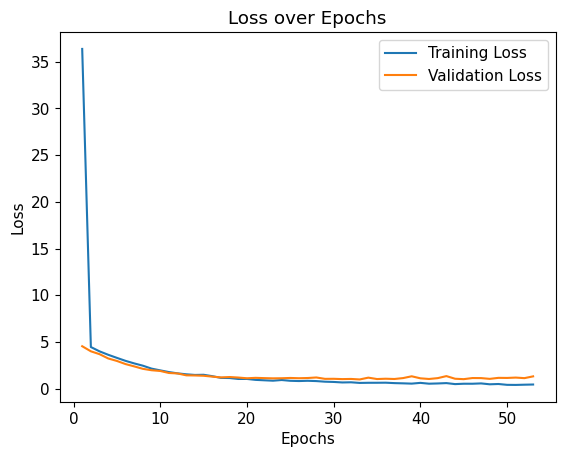

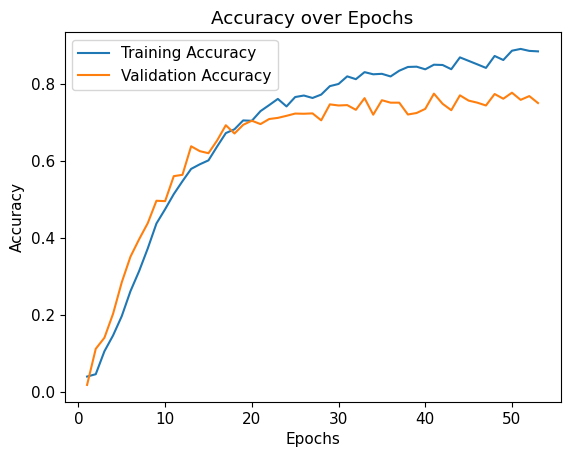

In [70]:
# Run training
train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies = train_model(
    model, train_loader, val_loader, test_loader, num_epochs=60,device=device, optimizer=optimizer, criterion=criterion,patience=20
)
# Generate the range of epochs
epochs = range(1, len(train_losses) + 1)

# Call the plotting function
plot_training_metrics(
    epochs=epochs,
    train_losses=train_losses,
    val_losses=val_losses,
    train_accuracies=train_accuracies,
    val_accuracies=val_accuracies,
)
